<a href="https://colab.research.google.com/github/Jose5110/Dog_Vision/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-End Multiclass Dog Breed Classsification

Multiclass image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem
Identifying the breed of a dog given an image of a dog.

## 2. Data
The data used is from Kaggle's dog breed identification competition.

Data Source: https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation
The evaluation is a file which contains the prediction probabilities for each dog breed of each test image.

Source: https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Information about the data:
* The data provided is a set of images (unstructured data), the aproach for this project will be to use deep learning/transfer learning.
* There are 120 breeds of dogs (120 classes, multiclass classification).
* There are 10000+ images in the training set (These images have labels).
* There are 10000+ images in the test set (These images have no labels), predictions will be done upon this set.

In [ ]:
import pandas as pd
import numpy as np

In [ ]:
# Import TensorFlow and TensorFlow hub into Colab
import tensorflow as tf
import tensorflow_hub as hub
print('TF version:', tf.__version__)
print('TF Hub version:', hub.__version__)

TF version: 2.9.2
TF Hub version: 0.12.0


In [ ]:
# Checking for GPU availability
print('GPU', 'available' if tf.config.list_physical_devices('GPU') else 'not available')

GPU available


## Getting the data ready (turning into tensors)

* Access data and check labels

In [ ]:
labels_csv = pd.read_csv('/content/drive/MyDrive/Dog Vision/labels.csv')

In [ ]:
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


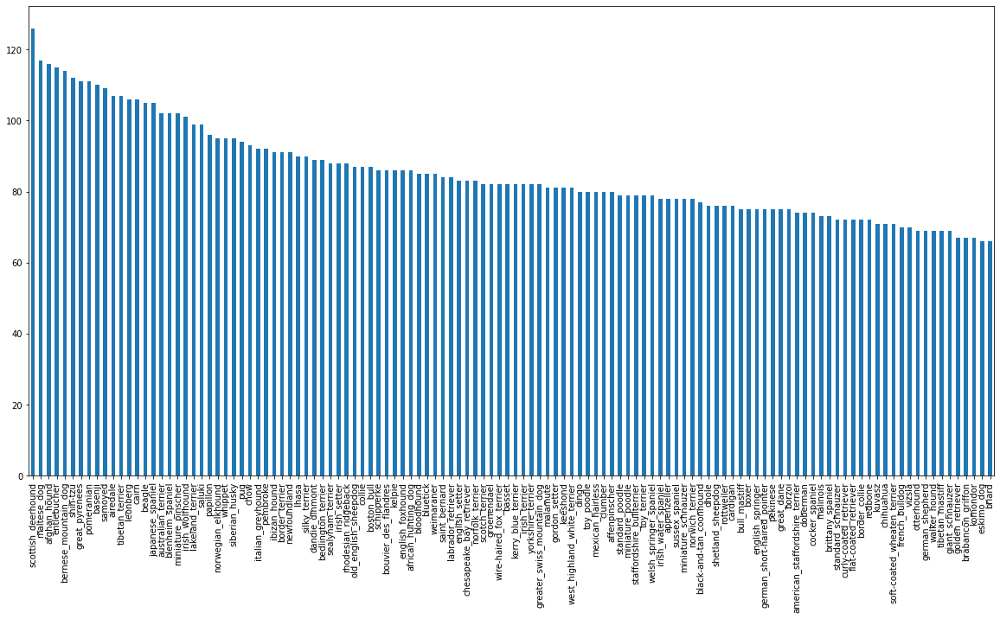

In [ ]:
# How many images are for each breed
labels_csv.breed.value_counts().plot.bar(figsize=(20,10));

In [ ]:
# Checking the median value of samples for each class
labels_csv.breed.value_counts().median()

82.0

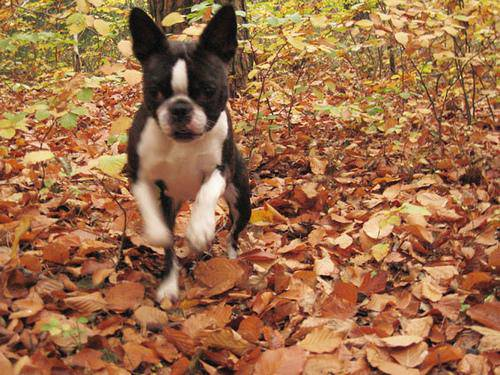

In [ ]:
# Taking a look at the images from the data
from IPython.display import Image
Image('/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg')

## Getting images and the labels

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create patterns from images id's
filenames = [f'/content/drive/MyDrive/Dog Vision/train/{fname}.jpg' for fname in labels_csv.id]

filenames[:10]

['/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Checking consistency between the newly created list and the number of image files
import os
if len(os.listdir('/content/drive/MyDrive/Dog Vision/train/')) == len(filenames):
  print('Files match actual amount of files')
else:
  print('Filenames do not match actual amount of files, check for errors in the list generation')

Files match actual amount of files


## Preparing the labels

In [ ]:
# Labels column transformed into a numpy array
labels = labels_csv.breed.to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# Checking if the number of labels matches the number of filenames
if len(labels) == len(filenames):
  print('Number of labels matches number of filenames')
else:
  print('Number of labels does NOT match number of filenames, check data directories')

Number of labels matches number of filenames


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turning a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Now turning every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where the labels occurs
print(boolean_labels[0].argmax()) # index where the label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


## Creating a validation set

Since kaggle doesn't provide a validation set, one will be created.

In [ ]:
# Setup x and y variables
x = filenames
y = boolean_labels

To speed up the experimentation process a sample of 1000 images will be used and increased as needed.

In [ ]:
# Setting the number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:'slider', min:1000, max:10000, step:1000}

In [ ]:
# Splitting the data into train and validation
from sklearn.model_selection import train_test_split

x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size = 0.2,
                                                  random_state = 42)

len(x_train), len(y_train), len(x_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Verifying the data
x_train[:5], y_train[:2]

(['/content/drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fals

## Preprocessing Images (turning images into Tensors)

Function features:
1.Take image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn the `image` (jpg) into Tensors
4. Normalize the image
5. Resize the `image`to be a shape of (224, 224)
6. Return the modified `image`

In [ ]:
# Example of how an imported image looks like for reference
from matplotlib.pyplot import imread

# Turning the image into a Numpy array
image = imread(filenames[50])
image.shape

(240, 320, 3)

The first 2 elements are the dimensions of the image, the last one represents the color channel, 3 been RGB

In [ ]:
image[:2]

array([[[176, 163, 146],
        [157, 144, 127],
        [148, 135, 118],
        ...,
        [109,  94,  99],
        [ 76,  60,  70],
        [ 76,  58,  70]],

       [[168, 155, 138],
        [148, 135, 118],
        [150, 137, 120],
        ...,
        [100,  85,  88],
        [ 64,  49,  56],
        [ 87,  70,  80]]], dtype=uint8)

In [ ]:
# Turning the image into a Tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 320, 3), dtype=uint8, numpy=
array([[[176, 163, 146],
        [157, 144, 127],
        [148, 135, 118],
        ...,
        [109,  94,  99],
        [ 76,  60,  70],
        [ 76,  58,  70]],

       [[168, 155, 138],
        [148, 135, 118],
        [150, 137, 120],
        ...,
        [100,  85,  88],
        [ 64,  49,  56],
        [ 87,  70,  80]]], dtype=uint8)>

## Preprocess function

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function  for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  '''
  Takes an image file path and turns the image into a tensor.
  '''
  # Read image file
  image = tf.io.read_file(image_path)
  # Turn the jpg image into a numerical tensor with 3 color channels RGB
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to the desired value (224,224)
  image = tf.image.resize(image, size=[img_size,img_size])

  return image

## Turning data into batches

This must be done so TensorFlow can perform correctly with the amount of resources available.

In this case the batch size will be 32.

In order to use TensorFlow effectively, the data must be in the form of tensor tuples of this form:
`(image, label)`

In [ ]:
# Create a function to return a tuple (image, label)
def get_image_label(image_path, label):
  '''
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  '''
  image = process_image(image_path)
  return image, label

In [ ]:
# Define the batch size
BATCH_SIZE = 32

# Create a function to turn all the data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  '''
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  '''
  # if the data is a test dataset, there's no labels
  if test_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices(tf.constant(x))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a validation dataset, there's no need to shuffle it
  elif valid_data:
    print('Creating validation data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                              tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  # If the data is a training dataset, there will be shuffling
  else:
    print('Creating training data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                              tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processing function
    # is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))
    data = data.map(get_image_label)
    data_batch= data.batch(BATCH_SIZE)
    return data_batch

In [ ]:
# Creating traininig and validation data batches
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Inspecting the attributes of the newly created data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

  m

## Visualizing data batches

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images,labels):
  '''
  Display a plot of 25 images and their labels from a data batch.
  '''
  plt.figure(figsize=(12, 12))
  for i in range(25):
    ax = plt.subplot(5, 5, i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis('off')

In [ ]:
# Note to self: this piece of code unbatches the previously created data batches
train_images, train_labels = next(train_data.as_numpy_iterator())

In [ ]:
val_images, val_labels = next(val_data.as_numpy_iterator())

In [ ]:
len(train_images), len(train_labels)

(32, 32)

In [ ]:
train_labels.shape

(32, 120)

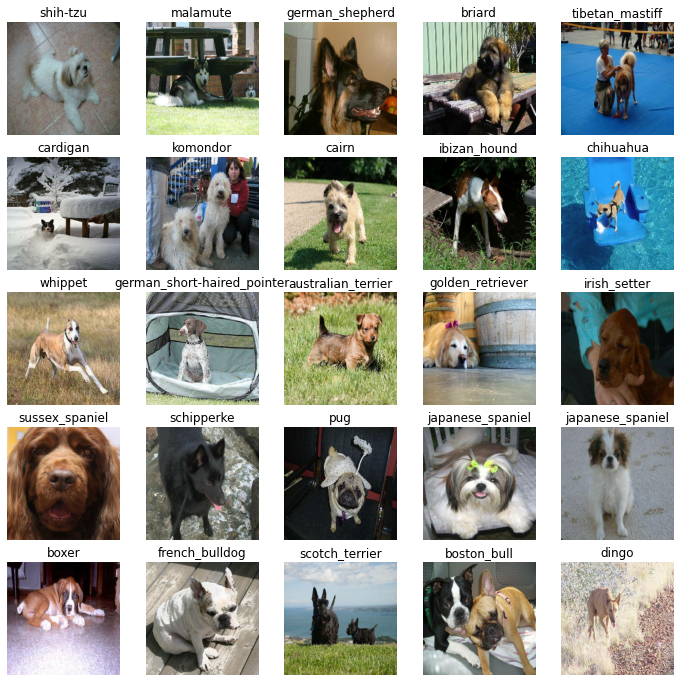

In [ ]:
# Train dataset visualization
show_25_images(train_images, train_labels)

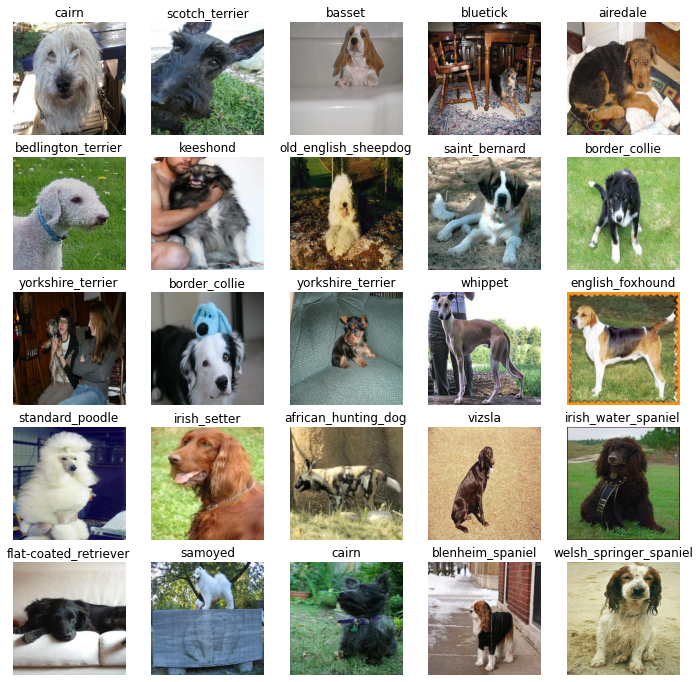

In [ ]:
# Validation dataset visualization
show_25_images(val_images, val_labels)

## Building a model
* Define input shape (image shape in the form of Tensors) of the model.
* The output shape (image label in the form of Tensors) of the model.
* URL of the model that will be used.

In [ ]:
# Setup input shape of the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # Batch, height, width, color channels

# Setup output shape
OUTPUT_SHAPE = len(unique_breeds)

# Set model URL from TensorFlow Hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5'

## Inputs, outputs and model ready, the next step is to implement a Keras deep learning model.

Throught a function:

* Takes the input shape, output shape and the model as chosen parameters.
* Defines the layers in the Keras model in a sequential fashion.
* Compiles the model (defines the way it is evaluated and how it should be improved).
* Builds the model (tells the model the input shape that it'll be getting).
* Returns the model.

In [ ]:
# Creates a function which builds a keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print('Building model with:', MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation='softmax') # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=['accuracy']
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks
Note: Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

The callbacks to be used are, one for TensorBoard which helps track our models progress and anothe for early stopping which prevents the model from training for too long.

### TensorBoard Callback

Setting up TensorBoard callback:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to the model's `fit()`function.
3. Visualize the model training logs with the `%tensorboard` magic function (after model training)

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Creating the function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory to store TensorBoard logs
  logdir = os.path.join('/content/drive/MyDrive/Dog Vision/logs',
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps to prevent the model from overfitting by stopping the training if a certain evaluation metric stops improving.

In [ ]:
# Create Early Stopping Callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3)

## Training a model (on subset data)

Test experiment, less data for a quicker result to verify if everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:'slider', min:10, max:100, step:10}

Model Training function:

* Create a model using `create_model()`
* Setup TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()`function in the model passing it the training data, validation data, number of epochs to train for `NUM_EPOCHS` and the callback to be used.
* Return the model.

In [ ]:
# Build a function to train and return a trained model
def train_model():
  '''
  Trains a given model and returns the trained version.
  '''
  # Create a model
  model = create_model()

  # Create new TensroBoard session everytime a model is trained
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the created callbacks
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 148s 5s/step - loss: 4.6966 - accuracy: 0.0787 - val_loss: 3.4154 - val_accuracy: 0.2200
Epoch 2/100
25/25 [==============================] - 4s 161ms/step - loss: 1.6788 - accuracy: 0.6550 - val_loss: 2.1679 - val_accuracy: 0.4950
Epoch 3/100
25/25 [==============================] - 4s 159ms/step - loss: 0.5673 - accuracy: 0.9438 - val_loss: 1.7102 - val_accuracy: 0.5550
Epoch 4/100
25/25 [==============================] - 4s 161ms/step - loss: 0.2528 - accuracy: 0.9900 - val_loss: 1.5192 - val_accuracy: 0.6150
Epoch 5/100
25/25 [==============================] - 4s 157ms/step - loss: 0.1474 - accuracy: 0.9975 - val_loss: 1.4479 - val_accuracy: 0.6350
Epoch 6/100
25/25 [==============================] - 3s 134ms/step - loss: 0.1007 - accuracy: 1.0000 - val_loss: 1.4126 - val_accuracy: 0.6300
Epoch 7/100
25/25 [==============================]

As the model performs a lot better on the training set than on the validation set it seems to be overfitting.

### Checking the TensorBoard logs

The TensorBoard magic function `%tensorboard` allows access and visualization of the logs directory created earlier.


In [ ]:
%tensorboard --logdir '/content/drive/MyDrive/Dog Vision/logs'

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on the validation data
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 108ms/step


array([[3.0915707e-03, 4.2138065e-04, 2.7347475e-04, ..., 1.6917856e-04,
        2.7068398e-05, 2.1233824e-03],
       [7.0639211e-04, 3.1544589e-03, 8.3809369e-04, ..., 8.6390635e-04,
        2.4793055e-03, 7.5791053e-05],
       [5.2722637e-05, 3.0383301e-06, 5.8593927e-05, ..., 3.9942075e-05,
        6.6890293e-06, 1.7205968e-04],
       ...,
       [1.6174878e-06, 1.2357902e-05, 3.9950155e-05, ..., 1.2832746e-05,
        6.4665981e-04, 2.8937382e-05],
       [3.9654602e-03, 2.9922975e-04, 1.5994077e-04, ..., 7.2754272e-05,
        1.7755416e-04, 2.5795661e-02],
       [2.4576954e-04, 7.1599352e-06, 1.2793163e-03, ..., 3.4488218e-03,
        1.0371617e-03, 4.0445072e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
# Quick analysis of the shape
len(y_val), len(unique_breeds)

(200, 120)

In [ ]:
# Checking prediction
index = 0
print(predictions[index])
print(f'Max value (probability prediction): {np.max(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')

[3.09157069e-03 4.21380653e-04 2.73474754e-04 2.23024967e-04
 1.87953759e-04 2.04081429e-04 4.97788563e-03 6.95924915e-04
 1.74467554e-04 3.18430830e-04 4.56145412e-04 2.32196631e-04
 1.07529457e-03 1.08687738e-04 9.77186792e-05 1.12657610e-04
 2.96258277e-05 7.70244300e-02 1.50293545e-05 1.26984742e-04
 2.54250626e-04 2.08675556e-04 9.02079864e-06 1.79554906e-03
 3.14673380e-05 1.35782859e-04 4.18587625e-01 1.57332353e-04
 3.85164632e-04 1.65332749e-04 2.39993475e-04 1.92017225e-03
 7.37297174e-04 4.86553254e-05 1.45838512e-05 4.22898605e-02
 1.09689827e-05 2.10442435e-04 2.75264494e-04 3.24427005e-04
 1.76028302e-03 2.34099789e-05 1.35782784e-05 3.19468490e-05
 4.29660076e-06 5.96994832e-05 3.41613522e-05 5.26403426e-04
 5.41533460e-04 1.33668815e-04 1.84110831e-05 4.75511188e-05
 1.01293990e-04 1.07603773e-04 7.20951648e-05 1.66594436e-05
 8.04395473e-04 3.48504796e-03 1.15087059e-04 1.61338657e-01
 1.66491827e-05 4.20209835e-05 4.77330899e-03 1.99149508e-05
 6.66258202e-05 1.073192

In [ ]:
# Turn prediction probabilities into their respective label
def get_pred_label(prediction_probabilities):
  '''
  Turns an array of prediction probabilities into a label
  '''
  return unique_breeds[np.argmax(prediction_probabilities)]

In [ ]:
# Testing the function
pred_label = get_pred_label(predictions[0])
pred_label

'cairn'

Since the validation data is still in a batch dataset, the next step is to unbatch it to make predictions on the validation images and then compare the predictions to the validation labels.



In [ ]:
def unbatch_dataset(dataset):
  '''
  Takes a batched dataset of (image, label) Tensors and returns separate arrays of images and
  labels.  
  '''
  images = []
  labels = []

  # Loop through unbatched data
  for image, label in dataset.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

In [ ]:
# Unbatch the validation data
val_images_, val_labels_ = unbatch_dataset(val_data)

The next step will be to get a better visualization of the:
* Prediction labels
* Validation labels (truth labels)
* Validation images

The visualization function will:
* Take an array of prediction probabilities an array of truth labels and an array of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  '''
  View the prediction, ground truth and image for sample n.
  '''
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title if the prediction is right or wrong
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'

  # Change plot title to be predicted label, probability of predicition and truth label
  plt.title('Pred: {}, Prob: {:2.0f}%, Truth: {}'.format(pred_label,
                                                                   np.max(pred_prob)*100,
                                                                   true_label),
                                                                   color=color)

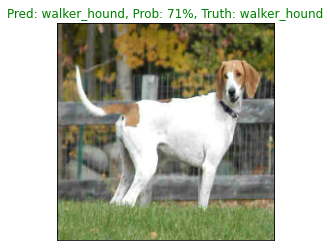

In [ ]:
plot_pred(predictions, val_labels_, val_images_, 32)

Now that the model top prediction can be visualized through the function, another one can be made to view the top 10 predictions.

This function will:
* Take an input of prediction probabilities array, a ground truth array and an integer.
* Find the prediction using `get_pred_label()`
* Find the top 10:
 * Prediction probabilities indexes.
 * Prediction probabilities values.
 * Prediction labels.
* Plot the top 10 prediction probability values and labels, coloring the true label green.

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  '''
  Plots the top 10 highest prediction confidences along with the truth label for sample n
  '''
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color='gray')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation='vertical')
  
  # Change the color of the true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass

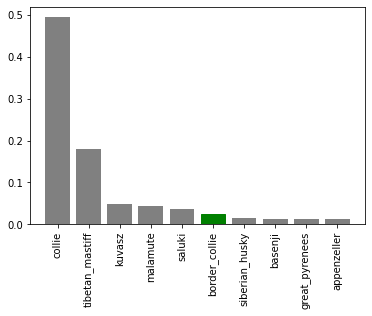

In [ ]:
plot_pred_conf(predictions, val_labels_, 9)

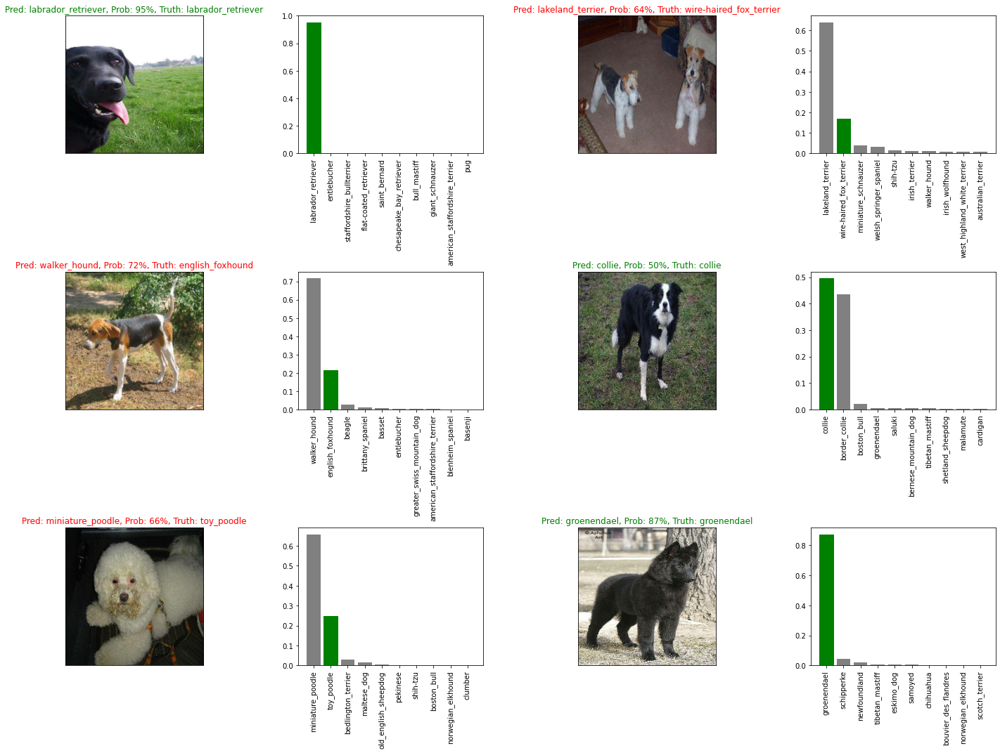

In [ ]:
i_multiplier = 40 # Modifies the set of images
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(predictions, val_labels_, val_images_, i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(predictions, val_labels_, i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading the trained model


In [ ]:
# Save model function
def save_model(model, suffix=None):
  '''
  Saves a given model in a directory and appends a suffix.
  '''
  # Create a model directory path name with current time
  modeldir = os.path.join('/content/drive/MyDrive/Dog Vision/Models',
                          datetime.datetime.now().strftime('%Y%m%d-%H%M%s'))
  model_path = modeldir + '-' + suffix + '.h5' # save format of model
  print(f'Saving model to: {model_path}...')
  model.save(model_path)
  return model_path

In [ ]:
# Load trained model function
def load_model(model_path):
  '''
  Loads a saved model from a specified path
  '''
  print(f'Loading saved model from: {model_path}')
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={'KerasLayer':hub.KerasLayer})
  return model

Testing the functions

In [ ]:
# Saving the trained model trained on 1000 images
save_model(model, suffix='1000-images-mobilenetv2-Adam')

Saving model to: /content/drive/MyDrive/Dog Vision/Models/20221105-00061667606786-1000-images-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Dog Vision/Models/20221105-00061667606786-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_images_model = load_model('/content/drive/MyDrive/Dog Vision/Models/20221105-00061667606786-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Dog Vision/Models/20221105-00061667606786-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 94ms/step - loss: 1.3640 - accuracy: 0.6300


[1.3640491962432861, 0.6299999952316284]

In [ ]:
# Evaluate the loaded model
loaded_1000_images_model.evaluate(val_data)

7/7 [==============================] - 3s 195ms/step - loss: 1.3640 - accuracy: 0.6300


[1.3640491962432861, 0.6299999952316284]

## Training the model on the full dataset

In [ ]:
len(x), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full dataset
full_data = create_data_batches(x, y)

Creating training data batches...


In [ ]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full mdoel
full_model = (create_model())

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# As theres no validation set when training on full data, validation accuracy can't be monitored
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                             patience=3)

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 41s 117ms/step - loss: 1.3536 - accuracy: 0.6695
Epoch 2/100
320/320 [==============================] - 38s 120ms/step - loss: 0.4014 - accuracy: 0.8813
Epoch 3/100
320/320 [==============================] - 36s 113ms/step - loss: 0.2407 - accuracy: 0.9338
Epoch 4/100
320/320 [==============================] - 38s 117ms/step - loss: 0.1538 - accuracy: 0.9631
Epoch 5/100
320/320 [==============================] - 37s 115ms/step - loss: 0.1074 - accuracy: 0.9784
Epoch 6/100
320/320 [==============================] - 37s 116ms/step - loss: 0.0781 - accuracy: 0.9863
Epoch 7/100
320/320 [==============================] - 38s 119ms/step - loss: 0.0588 - accuracy: 0.9925
Epoch 8/100
320/320 [==============================] - 38s 120ms/step - loss: 0.0461 - accuracy: 0.9936
Epoch 9/100
320/320 [==============================] - 42s 130ms/step - loss: 0.0370 - accuracy: 0.9952
Epoch 10/100
320/320 [==============================] - 39s 120m

In [ ]:
save_model(full_model, suffix='full-image-set-mobilenetv2-Adam')

Saving model to: /content/drive/MyDrive/Dog Vision/Models/20221105-00591667609986-full-image-set-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Dog Vision/Models/20221105-00591667609986-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Loading the full model
loaded_full_model = load_model('/content/drive/MyDrive/Dog Vision/Models/20221105-00591667609986-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Dog Vision/Models/20221105-00591667609986-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dateset

To make predictions on the test dataset this must be converted into the form of Tensor Batches.

Steps to take:
* Get the test image filename.
* Convert the filenames into test data batches using `create_data_batches()` setting the `test_data`parameter to `True`.
* Make a predictions array by passing the test batches to the `predict()` method called on the model.

In [ ]:
# Load test images filenames
test_path = '/content/drive/MyDrive/Dog Vision/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 1058s 3s/step


In [ ]:
# Save predictions (Numpy array) to a csv file
np.savetxt('/content/drive/MyDrive/Dog Vision/preds_array.csv', test_predictions, delimiter=',')

In [ ]:
test_predictions = np.loadtxt('/content/drive/MyDrive/Dog Vision/preds_array.csv', delimiter=',')

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions to submit to kaggle

Evaluation format: https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

The kaggle sample data submission ask for the predictions probaility outputs as a file with the following features: an ID column and a column for each dog breed.

To get the data in this format:
* Create a pandas Dataframe with an ID column as welll as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add the data from the predictions probabilities to each of the dog breed columns.
* Export the Dataframe as a csv file to submit it to kaggle.

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=['id'] + list(unique_breeds))

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
test_ids

In [ ]:
preds_df['id'] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e7ce78e874945f182a4f5149aa505b09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e6da14858db7781843db6af91551f627,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e6a5c18da7beedb1622bf7d18b452121,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e587c21aedc81f89b83dd326e034e7e0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e4897fe96990006c10ec7336772cbd37,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Adding the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e7ce78e874945f182a4f5149aa505b09,2.934078e-07,8.722475e-11,5.903986e-06,3.196036e-14,7.254093e-10,5.228192e-08,1.151088e-09,6.480986e-09,1.807042e-12,...,2.611515e-07,9.799865e-09,4.118096e-09,9.225882e-12,1.789932e-08,3.734897e-11,1.328417e-09,6.371346e-10,9.822616e-10,1.090115e-06
1,e6da14858db7781843db6af91551f627,9.800267e-06,2.546288e-04,4.357265e-06,2.320552e-07,5.955280e-09,2.183554e-09,2.351049e-09,5.347590e-10,1.931134e-12,...,1.717491e-09,1.046122e-11,8.509642e-10,1.536628e-07,2.182601e-08,2.105950e-11,2.536917e-09,4.205257e-06,2.356558e-09,2.057047e-08
2,e6a5c18da7beedb1622bf7d18b452121,6.607765e-11,4.027316e-10,3.864198e-11,9.483980e-11,3.678507e-10,6.464609e-13,5.502233e-10,1.849777e-12,1.848865e-10,...,1.822943e-09,1.493360e-11,3.951960e-10,1.036462e-07,5.994926e-11,1.129418e-09,4.550819e-11,7.712673e-11,7.757297e-12,1.199520e-08
3,e587c21aedc81f89b83dd326e034e7e0,5.619336e-08,9.606352e-08,3.562578e-09,8.456503e-07,1.287240e-08,2.479404e-08,1.814304e-10,3.049752e-09,1.037044e-07,...,9.586853e-05,1.594829e-08,4.667137e-07,1.595440e-08,1.674712e-06,3.818259e-11,2.307810e-10,8.488756e-08,6.476429e-07,8.234759e-08
4,e4897fe96990006c10ec7336772cbd37,1.220583e-11,1.207267e-08,3.056831e-09,9.055935e-18,2.204232e-12,1.797650e-12,2.658586e-10,1.131701e-10,3.054757e-12,...,1.204185e-13,4.221564e-08,1.197118e-12,2.503697e-10,3.568458e-12,1.157130e-14,3.283965e-08,7.619452e-06,5.641186e-11,8.758209e-08


In [ ]:
# Saving the predictions dataframe to csv for submission to kaggle 
preds_df.to_csv('/content/drive/MyDrive/Dog Vision/full_model_predictions_submission.csv',
                index=False)

## Making predictions on custom images
To make predictions on other dog images:
* Get the filepath of the image.
* Turn the filepaths into data batches using `create_data_batches`. Because the custom images don't have a labels the `test_data` parameter is set to `True`.
* Pass the custom image data batch to the model's `predict()` method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom image.

In [ ]:
# Get the custom images filepaths
custom_path = '/content/drive/MyDrive/Dog Vision/custom_images/'
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['/content/drive/MyDrive/Dog Vision/custom_images/dog_image_1.jpeg',
 '/content/drive/MyDrive/Dog Vision/custom_images/dog_image_2.jpg']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 0s 483ms/step


In [ ]:
custom_preds.shape

(2, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['whippet', 'norfolk_terrier']

In [ ]:
# Get custom images
custom_images = []
# Look through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

In [ ]:
# Check custom image predictions
def plot_pred_custom(prediction_probabilities, images, n=1):
  '''
  View the prediction for a custom image.
  '''
  pred_prob, image = prediction_probabilities[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change plot title to be predicted label, probability of predicition and truth label
  plt.title('Pred: {}, Prob: {:2.0f}%'.format(pred_label,
                                              np.max(pred_prob)*100))

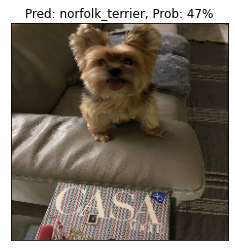

In [ ]:
plot_pred_custom(custom_preds, custom_images, 1)

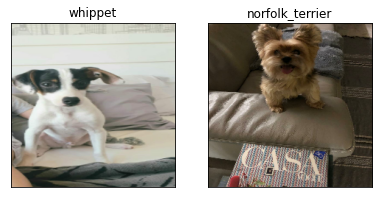

In [ ]:
# Check all custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)